# Explainability

Notebook to compute visual explainability results of the models prediction and to derive forecasted event positions estimations

# Config

In [7]:
COLAB = False

if COLAB : 
  configSetup = {
      'COLAB'           : 'True',
      'PATH_ROOT_DRIVE' : '/content/drive/MyDrive/Projects/Forecast',
      'PATH_ROOT_LOCAL' : '/content/session',
      'PATH_SUNDL'      : '/content/sundl',
      'PATH_PROJECT'    : '/content/flare_limits_pcnn'
  }
  !git clone https://github.com/gfrancisco20/sundl.git
  !git clone https://github.com/gfrancisco20/flare_limits_pcnn.git
  import sys
  import re
  sys.path.append(configSetup['PATH_SUNDL'])
  sys.path.append(configSetup['PATH_PROJECT'])
  configFile = f'{configSetup["PATH_PROJECT"]}/config.py'
  with open(configFile, 'r') as file:
    content = file.read()
  for constant in configSetup.keys():
    content = re.sub(re.compile(f'{constant} = .*'), f'{constant} = \'{configSetup[constant]}\'', content)
  with open(configFile, 'w') as file:
    file.write(content)
   
from config import *
if COLAB:
  from sundl.utils.colab import mountDrive
  # mouting drive content in session on colab
  mountDrive()
  
# you must request the models  files  or recompute  them with folder 1  to run this  notebook

# Libraries

In [8]:
import numpy as np
import pandas as pd
from scipy import ndimage
import tensorflow as tf

import matplotlib.pyplot as plt
import seaborn as sns

from sundl.utils.data import read_Dataframe_With_Dates

# Setup

In [9]:
FOLDER    = PATH_RES/'Results' 
modelName = 'C+_mpf_jpg_PTx8_RtdXall_EquiC_AW1e5D1e4_0193x0211x0094_24'

date      = pd.to_datetime('17-02-2023 10:00:00')

labelCol = modelName.split('_')[1]
h = modelName.split('_')[-1]

/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_77949/3969187537.py:4: UserWarning: Parsing dates in %d-%m-%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  date      = pd.to_datetime('17-02-2023 10:00:00')


# Explainability

## Load Image and Pred Results

/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_77949/1472741483.py:6: UserWarning: Parsing dates in %d-%m-%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  date      = pd.to_datetime('24-10-2014 22:00:00')


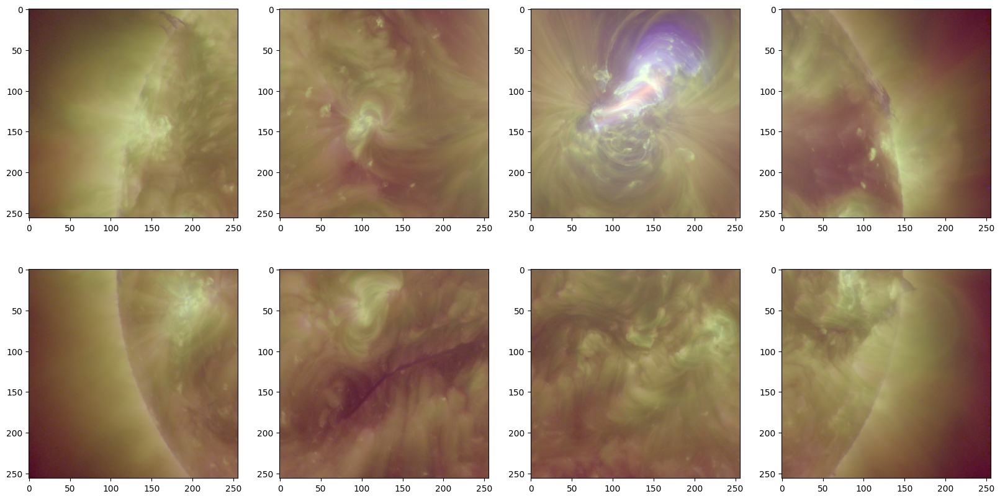

In [171]:
from sundl.utils.flare import flux2cls


rot_corr = True

date      = pd.to_datetime('24-10-2014 22:00:00')

# brightness and contrasst settings
f = 0.95
red     = 1.05#1.15
green   = 1.05#1.2#0.9#.2
blue    = 0.98#1.35#2#.5#.5
normminmax = True # minmmax normalisation of the distribution
# normpow = np.array([1.5,1.65,0.55]) #0.65 # pixel diistrib ttransformatio before minmax
normpow = np.array([0.9,0.7,0.5]) #0.65 # pixel diistrib ttransformatio before minmax

preds = read_Dataframe_With_Dates(F_PATH_PREDS_MODEL(F_PATH_PREDS(FOLDER),modelName,'pt',True))
preds = preds[preds.index == date]

channel = modelName.split('_')[-2]
fn = date.strftime(f'%Y%m%d_%H%M_{channel}.jpg')
fn2 = date.strftime(f'%Y%m%d_%H%M_{channel}.png')

pathImage = PATH_IMAGES/f'{channel}/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn}'
pathIm_hres = f'/Volumes/Toki/SDODataset/png/1024/equatorial/0193x0211x0094/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn2}'

image_pil_low = np.array(tf.keras.utils.load_img(pathImage)).astype('float64')
image_pil_hres = np.array(tf.keras.utils.load_img(pathIm_hres)).astype('float64')

image_pil =  image_pil_hres
down_size = 1024
patches_size = (256,256) #(112,112)

if normminmax :
  for chIdx in range(3):
    if normpow is not None:
      # pass
      # if chIdx==2:
      image_pil[:,:,chIdx] = np.power(image_pil[:,:,chIdx], normpow[chIdx])
      # #   # image_pil[:,:,chIdx] = np.log(1 + 1 * image_pil[:,:,chIdx])
      # elif chIdx==1:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.000001 * image_pil[:,:,chIdx])
      # else:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.005 * image_pil[:,:,chIdx])
    image_pil[:,:,chIdx] = 255 * (image_pil[:,:,chIdx] - image_pil[:,:,chIdx].min()) / (image_pil[:,:,chIdx].max() - image_pil[:,:,chIdx].min())
image_pil[:,:,0] = f*red * image_pil[:,:,0]  + 5 #* 1.05 +
image_pil[:,:,1] = f*green * image_pil[:,:,1] + 5 #* 1.07
image_pil[:,:,2] = f*blue * image_pil[:,:,2] + 5 #*1.12
image_pil[image_pil>255] = 255
image_pil = image_pil.astype('uint8')

image_pil[image_pil[:,:,0] + image_pil[:,:,1] + image_pil[:,:,2] >250*3] = 250


image = tf.convert_to_tensor(image_pil)
image = tf.expand_dims(image_pil,0)
patches = tf.image.extract_patches(images=image,
                                   sizes   = [1, patches_size[0], patches_size[1], 1],
                                   strides = [1, patches_size[0], patches_size[1], 1],
                                   rates   = [1, 1, 1, 1],
                                   padding='VALID')


fig = plt.figure(figsize=(20, 10))
for imgs in patches:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            # im = imgs[r,c].numpy()
            im = tf.reshape(imgs[r,c],shape=(patches_size[0],patches_size[1],3)).numpy().astype("uint8")
            plt.imshow(im)
            

            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')


patchesHres = patches

# 62.79517657339716
# 33.23346915335816
# 82.28079080397804
# 89.01055480027497

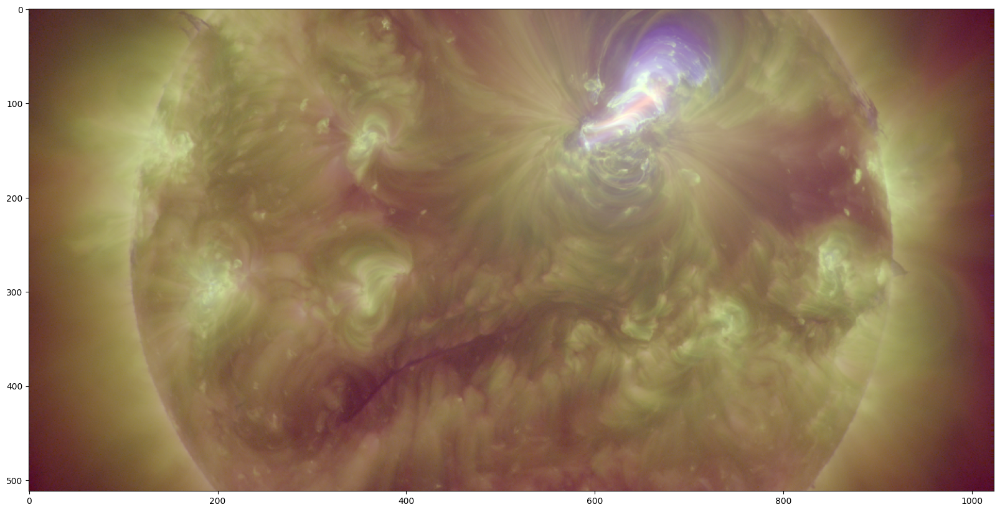

In [173]:
plt.imshow(image_pil.astype("uint8"))

### High Res

143.02688431658365 107.77511108861904
185.63893892430073 29.552480476600522
75.27045759825364 169.2527645809578
211.87129521341635 150.4848728829886


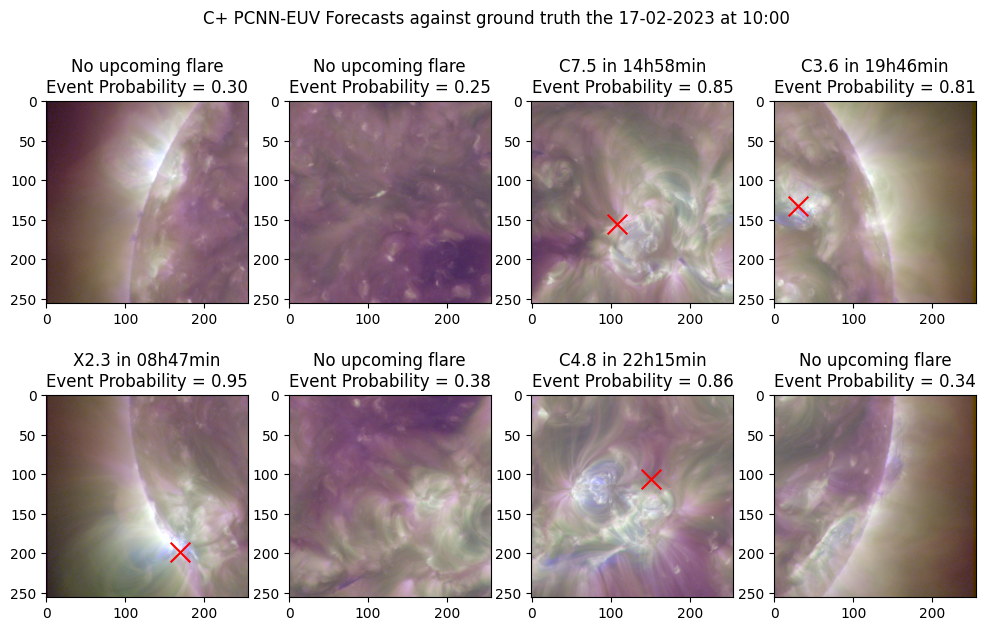

In [130]:
from sundl.utils.flare import flux2cls

rot_corr = True

# brightness and contrasst settings
f = 0.96
red     = 1.15#1.15
green   = 1.2#1.2#0.9#.2
blue    = 1.38#1.35#2#.5#.5
normminmax = True # minmmax normalisation of the distribution
normpow = np.array([1.5,1.65,0.55]) #0.65 # pixel diistrib ttransformatio before minmax

preds = read_Dataframe_With_Dates(F_PATH_PREDS_MODEL(F_PATH_PREDS(FOLDER),modelName,'pt',True))
preds = preds[preds.index == date]

channel = modelName.split('_')[-2]
fn = date.strftime(f'%Y%m%d_%H%M_{channel}.jpg')
fn2 = date.strftime(f'%Y%m%d_%H%M_{channel}.png')

pathImage = PATH_IMAGES/f'{channel}/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn}'
pathIm_hres = f'/Volumes/Toki/SDODataset/png/1024/equatorial/0193x0211x0094/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn2}'

image_pil_low = np.array(tf.keras.utils.load_img(pathImage)).astype('float64')
image_pil_hres = np.array(tf.keras.utils.load_img(pathIm_hres)).astype('float64')

image_pil =  image_pil_hres
down_size = 1024
patches_size = (256,256) #(112,112)

if normminmax :
  for chIdx in range(3):
    if normpow is not None:
      # if chIdx==2:
      image_pil[:,:,chIdx] = np.power(image_pil[:,:,chIdx], normpow[chIdx])
      #   # image_pil[:,:,chIdx] = np.log(1 + 1 * image_pil[:,:,chIdx])
      # elif chIdx==1:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.000001 * image_pil[:,:,chIdx])
      # else:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.005 * image_pil[:,:,chIdx])
    image_pil[:,:,chIdx] = 255 * (image_pil[:,:,chIdx] - image_pil[:,:,chIdx].min()) / (image_pil[:,:,chIdx].max() - image_pil[:,:,chIdx].min())
image_pil[:,:,0] = f*red * image_pil[:,:,0] #* 1.05
image_pil[:,:,1] = f*green * image_pil[:,:,1] #* 1.07
image_pil[:,:,2] = f*blue * image_pil[:,:,2] #*1.12
image_pil[image_pil>255] = 255
image_pil = image_pil.astype('uint8')

image_pil[image_pil[:,:,0] + image_pil[:,:,1] + image_pil[:,:,2] >250*3] = 250


image = tf.convert_to_tensor(image_pil)
image = tf.expand_dims(image_pil,0)
patches = tf.image.extract_patches(images=image,
                                   sizes   = [1, patches_size[0], patches_size[1], 1],
                                   strides = [1, patches_size[0], patches_size[1], 1],
                                   rates   = [1, 1, 1, 1],
                                   padding='VALID')


fig = plt.figure(figsize=(12, 7))
for imgs in patches:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            # im = imgs[r,c].numpy()
            im = tf.reshape(imgs[r,c],shape=(patches_size[0],patches_size[1],3)).numpy().astype("uint8")
            plt.imshow(im)
            if preds[f'mpf_pt{ptcID}'].iloc[0] < 1e-6:
              title = 'No upcoming flare'
            else:
              t2f = preds[f't2f_pt{ptcID}'].iloc[0]
              min = 60*(t2f-int(t2f))
              mpf = preds[f'mpf_pt{ptcID}'].iloc[0]
              cls = flux2cls(mpf, detailed = True)
              im_size = 4096
              dwsF = im_size / down_size
              mod = patches_size[0]
              x = preds[f'x_pt{ptcID}'].iloc[0]
              y = preds[f'y_pt{ptcID}'].iloc[0]

              # ROTATION CORRECATION
              if rot_corr:
                ylim = 614 / 0.6
                Rpix = 959.63 / 0.6
                ord = y - im_size //2
                if ord > 0:
                  ord = np.min((ord,ylim))
                else:
                  ord = np.max((ord,-ylim))
                y = ord
                ref = 2 * np.sqrt(Rpix**2 - ord**2) # ref = 2*Rpix
                half_carr = 27 * 24 / 2
                rot =  ref * t2f / half_carr
                x = x - rot


              x = x / dwsF % mod
              y = y / dwsF % mod


              print(rot, x)

              plt.scatter(x, y, marker="x", color="red", s=200)
              title = f'{cls} in {int(t2f):0>2d}h{min:0>2.0f}min'
            prob = preds[f'pred_pt{ptcID}'].iloc[0]
            title += f'\nEvent Probability = {prob:.2f}'
            ax.set_title(title)
            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')
fig.suptitle(f'C+ PCNN-EUV Forecasts against ground truth the {ts}')


patchesHres = patches

# 62.79517657339716
# 33.23346915335816
# 82.28079080397804
# 89.01055480027497

### Low Res

143.02688431658365 47.15161110127087
185.63893892430073 12.929210208512757
75.27045759825364 74.04808450416904
211.87129521341635 65.83713188630753


Text(0.5, 0.98, 'C+ PCNN-EUV Forecasts against ground truth the 17-02-2023 at 10:00')

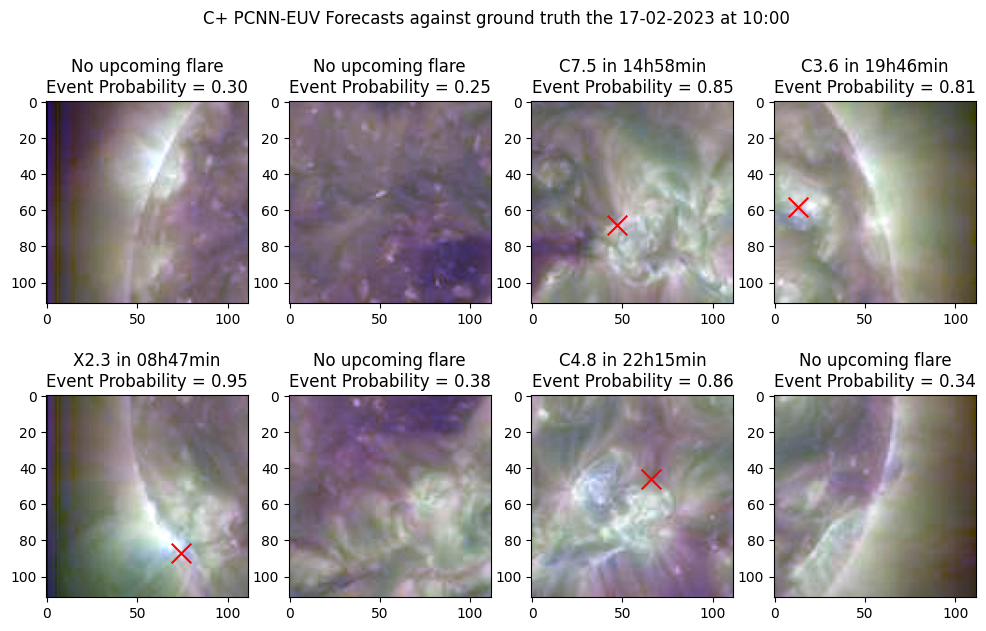

In [95]:
from sundl.utils.flare import flux2cls

rot_corr = True

# brightness and contrasst settings
f = 0.96
red     = 1.15#1.15
green   = 1.2#1.2#0.9#.2
blue    = 1.38#1.35#2#.5#.5
normminmax = True # minmmax normalisation of the distribution
normpow = np.array([1.5,1.65,0.55]) #0.65 # pixel diistrib ttransformatio before minmax

preds = read_Dataframe_With_Dates(F_PATH_PREDS_MODEL(F_PATH_PREDS(FOLDER),modelName,'pt',True))
preds = preds[preds.index == date]

channel = modelName.split('_')[-2]
fn = date.strftime(f'%Y%m%d_%H%M_{channel}.jpg')
fn2 = date.strftime(f'%Y%m%d_%H%M_{channel}.png')

pathImage = PATH_IMAGES/f'{channel}/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn}'
pathIm_hres = f'/Volumes/Toki/SDODataset/png/1024/equatorial/0193x0211x0094/{date.year}/{date.month:0>2d}/{date.day:0>2d}/{fn2}'

image_pil_low = np.array(tf.keras.utils.load_img(pathImage)).astype('float64')
image_pil_hres = np.array(tf.keras.utils.load_img(pathIm_hres)).astype('float64')

image_pil =  image_pil_low
down_size = 448
patches_size = (112,112) #(112,112)

if normminmax :
  for chIdx in range(3):
    if normpow is not None:
      # if chIdx==2:
      image_pil[:,:,chIdx] = np.power(image_pil[:,:,chIdx], normpow[chIdx])
      #   # image_pil[:,:,chIdx] = np.log(1 + 1 * image_pil[:,:,chIdx])
      # elif chIdx==1:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.000001 * image_pil[:,:,chIdx])
      # else:
      #   image_pil[:,:,chIdx] = np.log(1 + 0.005 * image_pil[:,:,chIdx])
    image_pil[:,:,chIdx] = 255 * (image_pil[:,:,chIdx] - image_pil[:,:,chIdx].min()) / (image_pil[:,:,chIdx].max() - image_pil[:,:,chIdx].min())
image_pil[:,:,0] = f*red * image_pil[:,:,0] #* 1.05
image_pil[:,:,1] = f*green * image_pil[:,:,1] #* 1.07
image_pil[:,:,2] = f*blue * image_pil[:,:,2] #*1.12
image_pil[image_pil>255] = 255
image_pil = image_pil.astype('uint8')

image_pil[image_pil[:,:,0] + image_pil[:,:,1] + image_pil[:,:,2] >250*3] = 250


image = tf.convert_to_tensor(image_pil)
image = tf.expand_dims(image_pil,0)
patches = tf.image.extract_patches(images=image,
                                   sizes   = [1, patches_size[0], patches_size[1], 1],
                                   strides = [1, patches_size[0], patches_size[1], 1],
                                   rates   = [1, 1, 1, 1],
                                   padding='VALID')


fig = plt.figure(figsize=(12, 7))
for imgs in patches:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            # im = imgs[r,c].numpy()
            im = tf.reshape(imgs[r,c],shape=(patches_size[0],patches_size[1],3)).numpy().astype("uint8")
            plt.imshow(im)
            if preds[f'mpf_pt{ptcID}'].iloc[0] < 1e-6:
              title = 'No upcoming flare'
            else:
              t2f = preds[f't2f_pt{ptcID}'].iloc[0]
              min = 60*(t2f-int(t2f))
              mpf = preds[f'mpf_pt{ptcID}'].iloc[0]
              cls = flux2cls(mpf, detailed = True)
              im_size = 4096
              dwsF = im_size / down_size
              mod = patches_size[0]
              x = preds[f'x_pt{ptcID}'].iloc[0]
              y = preds[f'y_pt{ptcID}'].iloc[0]

              # ROTATION CORRECATION
              if rot_corr:
                ylim = 614 / 0.6
                Rpix = 959.63 / 0.6
                ord = y - im_size //2
                if ord > 0:
                  ord = np.min((ord,ylim))
                else:
                  ord = np.max((ord,-ylim))
                y = ord
                ref = 2 * np.sqrt(Rpix**2 - ord**2) # ref = 2*Rpix
                half_carr = 27 * 24 / 2
                rot =  ref * t2f / half_carr
                x = x - rot


              x = x / dwsF % mod
              y = y / dwsF % mod


              print(rot, x)

              plt.scatter(x, y, marker="x", color="red", s=200)
              title = f'{cls} in {int(t2f):0>2d}h{min:0>2.0f}min'
            prob = preds[f'pred_pt{ptcID}'].iloc[0]
            title += f'\nEvent Probability = {prob:.2f}'
            ax.set_title(title)
            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')
fig.suptitle(f'C+ PCNN-EUV Forecasts against ground truth the {ts}')

# 62.79517657339716
# 33.23346915335816
# 82.28079080397804
# 89.01055480027497

/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_67131/1212577282.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(im[:,:,0])


<Axes: ylabel='Density'>

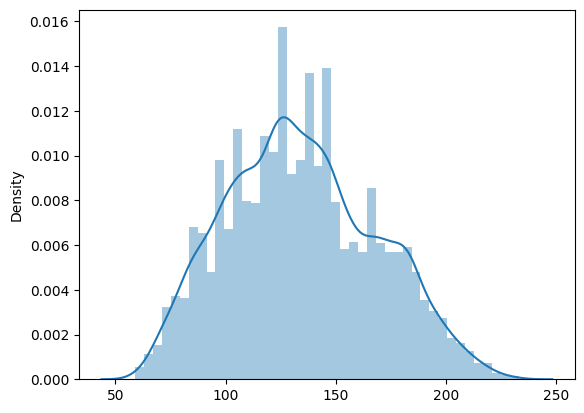

In [4]:
sns.distplot(im[:,:,0])

/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_67131/3222709253.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(im[:,:,1])


<Axes: ylabel='Density'>

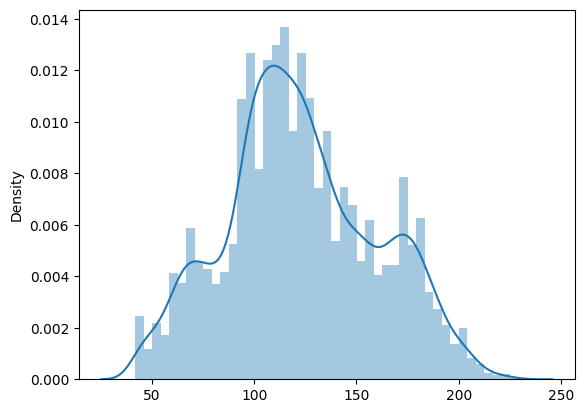

In [5]:
sns.distplot(im[:,:,1])

/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_67131/2620641847.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(im[:,:,2])


<Axes: ylabel='Density'>

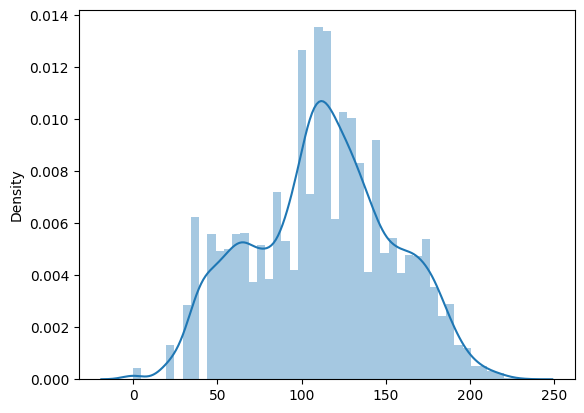

In [6]:
sns.distplot(im[:,:,2])

## Loading model and input

In [80]:

from pathlib import Path
from glob import glob
import datetime
import dill as pickle

from sundl.dataloader.sdocml import builDS_image_feature
from sundl.explainability import getDistributedModel
from utilsTest import custom_objects_for_model_loading


pathTestSamples = F_PATH_TEST(labelCol, h)


dfTest = pd.read_csv(pathTestSamples)
dfTest['timestamp'] = dfTest['timestamp'].apply(lambda x: datetime.datetime.strptime(x,'%Y-%m-%d %H:%M:%S')) # '%Y/%m/%d/H%H00/
dfTest = dfTest.set_index('timestamp',drop = True)

samples = dfTest[(dfTest.index >= date + pd.DateOffset(hours = 24)) & (dfTest.index < date + pd.DateOffset(hours = 24 + 2))].copy()

modelsConfigAndPath = glob((FOLDER/f'models/{modelName}*').as_posix())
modelFoldsPath = [m for m in modelsConfigAndPath if m[-3:]!='pkl']
modelFoldsConfigs = [m for m in modelsConfigAndPath if m[-3:]=='pkl']
# foldIds = [m[-5:] for m in modelFoldsPath]
foldIds = [m.split('/')[-1].split('.')[0][-5:] for m in modelFoldsPath]
n_fold = len(foldIds)

# for foldIdx in range(n_fold-1,-1,-1):
#   if not Path(f'{modelFoldsPath[foldIdx]}/assets').exists():
#     modelFoldsPath.pop(foldIdx)
#     modelFoldsConfigs.pop(foldIdx)
#     foldIds.pop(foldIdx)
print('FOLDS WITH MODELS: ',foldIds)

with open(modelFoldsConfigs[0], 'rb') as f1:
  config = pickle.load(f1)
configTest = config['dataset_val']
configTest['dfTimeseries'] = dfTest#[dfTest.index.isin(preds.index+pd.offsets.DateOffset(hours=24))].copy()

# configTest['dfTimeseries'] = configTest['dfId2History']
# configTest.pop('dfId2History')
configTest['pathDir'] = PATH_IMAGES
configTest['samples'] = samples
configTest['cache'] = False
configTest['shuffle'] = False
configTest['weightByClass'] = False
configTest['batch_size'] = 1
# PROBEM WITH SAVED ENCODER -> RRREINSTATINT IT**
classTresholds = configTest['classTresholds']
binCls = modelName[0]
configTest['labelEncoder'] = lambda flux : float(flux >= classTresholds[binCls][0])

dsTest , _, missing_file_regexp, dfSamples_corr = builDS_image_feature(**configTest)
dfSamples_corr = dfSamples_corr.set_index('timestamp',drop = True)

# predictionss
predsFd = []
patch_predsFd = []
models = []
patchers = []
patcheModels = []
for foldIdx,modelFoldPath in enumerate(modelFoldsPath):
  models.append(tf.keras.models.load_model(modelFoldPath, compile=False, custom_objects = custom_objects_for_model_loading))
  for layer in models[-1].layers:
    # print(layer.name)
    if layer.name == 'time_distributed':
      patchesBlock = layer
  patcheModels.append(tf.keras.Model(models[-1].input, patchesBlock.output, name='patches'))
  # predsFd.append(model.predict(dsTest))
  patchers.append(getDistributedModel(models[-1]))


FOLDS WITH MODELS:  ['fd000', 'fd002', 'fd003', 'fd004', 'fd001']


/Users/greg/Projects/flare_limits_pcnn/../sundl/sundl/dataloader/sdocml.py:197: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ).apply(lambda x: x[-1]).shift(freq = f'-{offLabel}H')#[:-int(offLabel/2)]


Samples shiiftng done
------------------------------
labels.shape (1, 1)
------------------------------


/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_77949/2083808719.py:54: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  configTest['labelEncoder'] = lambda flux : float(flux >= classTresholds[binCls][0])


img_size (224, 448, 3)
im.shape (224, 448, 3)
Num layers and num updated :  517 282
Num layers and num updated :  517 282
Num layers and num updated :  517 282
Num layers and num updated :  517 282
Num layers and num updated :  517 282


## Compute explainability

In [91]:

from skimage.transform import resize
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

__all__ = ['getDistributedModel',
           'preprocIm',
           'visual_explainer',
           'gradCam',
           'guidedBackProp',
           'visual_explainer',
           'EnsembleExplainabilityRGB'
           ]

def preprocIm(images, preprocFunc = tf.keras.applications.efficientnet_v2.preprocess_input):
  preprocessed_img = preprocFunc(images)
  imgArr = preprocessed_img.numpy()[0].astype('uint8')
  return images, imgArr, preprocessed_img

def getDistributedModel(model, distributedLayerName = 'time_distributed',custom_objects=None):
  """
  Retrieve time_distributed layer and instatiate it as a model
  """ 
  for layer in model.layers:
    # if layer.name == distributedLayerName:
    if distributedLayerName in layer.name:
      distributedModel = layer
  var = distributedModel.variables
  conf = distributedModel.get_config()
  # instantiate patcher from config
  cnn = tf.keras.models.model_from_config(
      conf['layer'],
      custom_objects=custom_objects
  )
  # organising trained weights from var
  layerWeights = {}
  for layer in cnn.layers:
    layerVars = [v.name for v in layer.variables]
    layerWeights[layer.name] = [None for i in range(len(layerVars))]
    for idx in range(len(var)):
      varname = var[idx].name
      if varname in layerVars:
        # we must preserve vars layer order for the set_weight() to work
        varIdx = layerVars.index(varname)
        layerWeights[layer.name][varIdx] = var[idx]
  # set trained weights in instantiated cnn
  num_updated_layer = 0
  num_layer = 0
  for layer in cnn.layers:
    num_layer+=1
    if len(layerWeights[layer.name]) > 0:
      layer.set_weights(layerWeights[layer.name])
      num_updated_layer+=1
  print('Num layers and num updated : ',num_layer, num_updated_layer)
  return cnn

def gradCam(
    imTf,
    model,
    last_conv_layer_name = 'top_activation', #EffN2-S case
    classifier_layer_names =  ['avg_pool', 
                               'batch_normalization', 
                               'top_dropout',
                               'pred'], #EffN2-S case
    imSize = (128,128)
    ):
  preds = model.predict(imTf)
  img_array = imTf
  # Convolution model : input -> last conv layer's output (on which the class activation is computed)
  last_conv_layer  = model.get_layer(last_conv_layer_name)
  conv_model       = tf.keras.Model(model.inputs, last_conv_layer.output)
  # classifier_model : last conv layer's output / class activation -> final output : prediction
  classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
  x = classifier_input
  for layer_name in classifier_layer_names:
      x = model.get_layer(layer_name)(x)
  classifier_model = tf.keras.Model(classifier_input, x)

  # reccording conv model gradients
  with tf.GradientTape() as tape:
      last_conv_layer_output = conv_model(img_array)
      tape.watch(last_conv_layer_output)
      # Calcula la predicción con modelo clasificador, para la clase mas probable
      # Retrieve class prediction index and value
      preds = classifier_model(last_conv_layer_output)
      top_pred_index = tf.argmax(preds[0])
      print(top_pred_index)
      top_class_channel = preds[:, top_pred_index]
  # gradients of the last conv with respect to the input
  grads = tape.gradient(top_class_channel, last_conv_layer_output)
  # gradient average per filter layer
  pooled_grads = tf.reduce_mean(grads, axis=(0,1,2)) # TODO : generalised to any number of channels
  # last conv output
  last_conv_layer_output = last_conv_layer_output[0]
  # gcam result
  heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]

  heatmap = tf.squeeze(heatmap)
  heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
  vizGcam = resize(heatmap.numpy(), imSize)

  tf.keras.backend.clear_session()
  del grads
  del pooled_grads
  del tape
  tf.keras.backend.clear_session()
  return vizGcam



def guidedBackProp(
    preprocessed_img,
    model,
    include_relu    = False, # there are no relu in effnet
    include_swish   = True, # effnet case
    include_sigmoid = False,
    include_linear  = False,
    LAST_CONV_NAME = ''
    ):
   # Model until the last conv layer (where spatial info is preserved)
  gb_model = tf.keras.models.Model(
      inputs = [model.inputs],
      outputs = [model.get_layer(LAST_CONV_NAME).output]
  )

  # Activations for back prop gradient
  @tf.custom_gradient
  def guidedRelu(x):
    def grad(dy):
      return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
    return tf.nn.relu(x), grad
  @tf.custom_gradient
  def guidedSwish(x):
    def grad(dy):
      return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
    return tf.nn.swish(x), grad
  @tf.custom_gradient
  def guidedLinear(x):
    def grad(dy):
      return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
    return x, grad
  @tf.custom_gradient
  def guidedSigmoid(x):
    def grad(dy):
      return tf.cast(dy>0,"float32") * tf.cast(x>0, "float32") * dy
    return tf.nn.sigmoid(x), grad

  # Overriding Actiivations ReLu with the guided gradient
  layer_dict = [layer for layer in gb_model.layers[1:] if hasattr(layer,'activation')]
  #numRelu = 0
  for layer in layer_dict:
    #print(layer.activation)
    if layer.activation == tf.keras.activations.relu and include_relu:
      layer.activation = guidedRelu
      #numRelu += 1
    elif layer.activation == tf.keras.activations.swish and include_swish:
      layer.activation = guidedSwish
    elif layer.activation == tf.keras.activations.sigmoid and include_sigmoid:
      layer.activation = guidedSigmoid
    elif layer.activation == tf.keras.activations.linear and include_linear:
      layer.activation = guidedLinear

  # Recording preprocessed input image during the forward path
  with tf.GradientTape() as tape:
    inputs = tf.cast(preprocessed_img, tf.float32)
    tape.watch(inputs)
    outputs = gb_model(inputs)[0]
  grads = tape.gradient(outputs,inputs)[0]

  # Guided back prop
  guided_back_prop =grads
  vizGb = np.dstack([guided_back_prop[:, :, cIdx] for cIdx in range(guided_back_prop.shape[2])])
  vizGb -= np.min(vizGb)
  vizGb /= vizGb.max()

  tf.keras.backend.clear_session()
  del grads
  #del guided_back_prop
  del tape
  tf.keras.backend.clear_session()
  return vizGb, guided_back_prop

def guidedGradCam(gradCamRes, guidedBackPropRes):
  gbGcam = np.dstack((
          guidedBackPropRes[:, :, 0] * gradCamRes,
          guidedBackPropRes[:, :, 1] * gradCamRes,
          guidedBackPropRes[:, :, 2] * gradCamRes,
      ))
  return gbGcam

def visual_explainer(
    model,
    preprocFunc = tf.keras.applications.efficientnet_v2.preprocess_input,
    last_conv_layer_name = 'top_activation', #EffN2-S case
    classifier_layer_names =  ['avg_pool', 
                               'batch_normalization', 
                               'top_dropout',
                               'pred'], #EffN2-S case
    include_relu    = False, # there are no relu in effnet
    include_swish   = True, # Effnet case
    include_sigmoid = False,
    include_linear  = False,
    imSize = (112,112),
    images = None
    ):

  imTf, imgArr, preprocessed_img = preprocIm(images, preprocFunc = preprocFunc)
  vizGcam = gradCam(imTf, model, last_conv_layer_name, classifier_layer_names, imSize)
  vizGb, guided_back_prop = guidedBackProp(preprocessed_img, model, include_relu, include_swish, include_sigmoid, include_linear, LAST_CONV_NAME = last_conv_layer_name)

  vizGbGcam = np.dstack((
          guided_back_prop[:, :, 0] * vizGcam,
          guided_back_prop[:, :, 1] * vizGcam,
          guided_back_prop[:, :, 2] * vizGcam,
      ))


  tf.keras.backend.clear_session()
  del guided_back_prop
  tf.keras.backend.clear_session()
  return imgArr, vizGcam, vizGb, vizGbGcam


def EnsembleExplainabilityRGB(ax              ,
                              rowIdx          ,
                              modName         ,
                              imgIdx          ,
                              alphaMask       ,
                              sigmaFact       ,
                              ds              ,
                              models          ,
                              maskBp          ,
                              bpCmam          , # twilight_shifted ; twilight_shifted
                              cmapMask        ,
                              fontsize,
                              label = '',
                              images = None    ,
                              imSize = (112,112)
                              ):
  maskTag = 'Gbp' if maskBp else 'Gd-GCAM'

  for idx in range(len(models)):
    mod = models[idx]
    label = np.argmax(label)
    pred = mod.predict(images)

    img, vizGcam, vizGb, vizGbGcam = visual_explainer(
        model                  = mod,
        images                 = images,
        preprocFunc            = tf.keras.applications.efficientnet_v2.preprocess_input,
        last_conv_layer_name   = 'top_activation', #EffN2-S case
        classifier_layer_names =  ['avg_pool', 'top_dropout','pred'], #EffN2-S case
        include_relu           = False, # there are no relu in effnet
        include_swish          = True,
        include_sigmoid        = False,
        include_linear         = False,
        imSize = imSize
        )

    # alpha    =alphaMask
    # sigmaFact = sigmaFact#0.5
    # mean = vizGbGcam.mean()
    # sigma = vizGbGcam.std()
    # min =  mean - sigma * sigmaFact #0.3
    # max =  mean + sigma * sigmaFact  #0.4
    # #vizGbGcam[(vizGbGcam>min) * (vizGbGcam<max)] = 0
    # vizGbGcam[(vizGbGcam<max)] = 0

    # finalVizGcam = dip.Overlay(magnetogram, mask,  color = [255,secCol,0])
    if idx == 0:
      vizGcamEns = vizGcam.astype('float32')
      vizGbEns = vizGb.astype('float32')
      vizGbGcamEns = vizGbGcam.astype('float32')
      predEns = pred
    else:
      vizGcamEns += vizGcam.astype('float32')
      vizGbEns += vizGb.astype('float32')
      vizGbGcamEns += vizGbGcam.astype('float32')
      predEns += pred

    tf.keras.backend.clear_session()
    del mod
    tf.keras.backend.clear_session()

  vizGcamEns = vizGcamEns / 10
  vizGbEns = vizGbEns / 10
  vizGbGcamEns = vizGbGcamEns / 10
  predEns = predEns/10

  ###################@@
  # # treshold = 0
  # #vizGbGcamEns = np.mean(vizGbGcamEns, axis = -1)
  # vizGbGcamEns = ( vizGbGcamEns - vizGbGcamEns.min()) / (vizGbGcamEns.max() - vizGbGcamEns.min()) #255*
  # # vizGbGcamEns[vizGbGcamEns<treshold] = 0
  # #vizGbEns  = np.mean(vizGbEns, axis = -1)
  # vizGbEns = ( vizGbEns - vizGbEns.min()) / (vizGbEns.max() - vizGbEns.min()) #255*
  # # vizGbEns[vizGbEns<treshold] = 0
  ###################@@
  vizGbGcamEns = np.mean(vizGbGcamEns, axis = -1)
  vizGbGcamEns = ( vizGbGcamEns - vizGbGcamEns.min()) / (vizGbGcamEns.max() - vizGbGcamEns.min()) #255*
  vizGbEns  = np.mean(vizGbEns, axis = -1)
  vizGbEns = ( vizGbEns - vizGbEns.min()) / (vizGbEns.max() - vizGbEns.min())

  ax[rowIdx,0].imshow(img)
  ax[rowIdx,1].imshow(img)#, cmap=plt.get_cmap('jet'))
  ax[rowIdx,1].imshow(vizGcamEns, alpha=alphaMask, cmap=plt.get_cmap('jet'))
  ax[rowIdx,2].imshow(vizGbEns, cmap=bpCmam)
  ax[rowIdx,3].imshow(vizGbGcamEns, cmap=bpCmam)

  # vizGbGcam[(vizGbGcamEns<max)] = 0
  # mask = np.zeros((128,128),dtype='bool')
  # mask[vizGbGcamEns>0] = 1
  if maskBp:
    mask = np.copy(vizGbEns)
  else:
    #vizGbGcam[(vizGbGcam<max)] = 0
    #mask = np.zeros((128,128),dtype='bool')
    #mask[vizGbGcam>0] = 1
    mask = np.copy(vizGbGcamEns)
  mean = mask.mean()
  sigma = mask.std()
  min =  mean - sigma * sigmaFact #0.3
  max =  mean + sigma * sigmaFact  #0.4
  mask[(mask<max)] = 0

  ax[rowIdx,4].imshow(img)#, cmap = plt.get_cmap('binary').reversed())
  ax[rowIdx,4].imshow(mask, alpha = alphaMask, cmap = cmapMask)


  ax[rowIdx,0].set_title(f'Model: {modName} \nPred : {predEns[0][0]:.2f}', fontsize=fontsize)
  ax[rowIdx,1].set_title(f'Grad-CAM', fontsize=fontsize)
  ax[rowIdx,2].set_title(f'GuidedBacProp', fontsize=fontsize)
  ax[rowIdx,3].set_title(f'Gd-GCAM', fontsize=fontsize)
  # ax[0,4].set_title('(1-2\u03C3)-GbCAM mask on Blos', fontsize=fontsize)
  ax[rowIdx,4].set_title(f'>(\u03BC+{sigmaFact}\u03C3)-{maskTag} mask on input', fontsize=fontsize)
  return predEns, vizGcamEns, vizGbEns, vizGbGcamEns


1/1 [==============================] - 0s 74ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 62ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 57ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 76ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 71ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 115ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 63ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 62ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 54ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 54ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==============================] - 0s 70ms/step
tf.Tensor(0, shape=(), dtype=int64)
1/1 [==========================

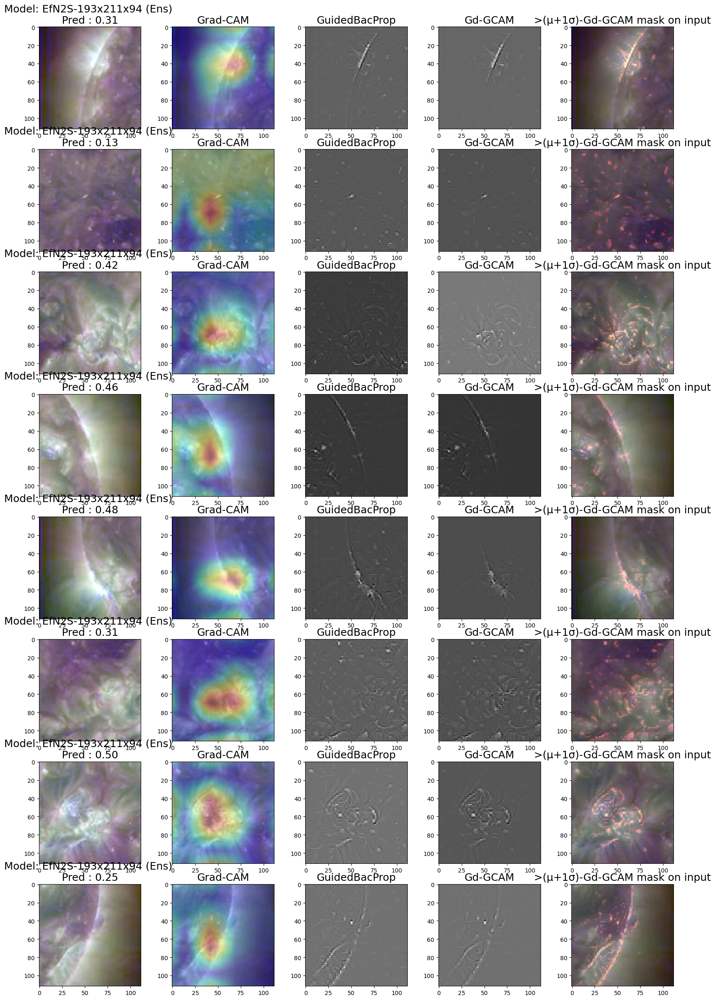

In [92]:
%%time
# from sundl.explainability import EnsembleExplainabilityRGB

plt.rcParams["figure.figsize"] = (20,30)


# ptcIdx = 3

maskBp = False
fontsize = 18
alphaMask = 0.3
sigmaFact = 1

# patchesReady = [tf.expand_dims(patches[0,ptcIdx], axis = 0) for ptcIdx in range(patches.shape[1])]

patchesReady = [tf.expand_dims(tf.reshape(patches[0][r,c],shape=(112,112,3)).numpy().astype("uint8"), axis = 0) \
                for r in range(2) for c in range(4)]
fig, ax = plt.subplots(len(patchesReady),5)

predsCorona =  []
vizGcamEnsRes = []
vizGbEnsRes = []
vizGbGcamEnsRes = []

for ptcIdx in range(len(patchesReady)):
  predCorona, vizGcamEns, vizGbEns, vizGbGcamEns  = EnsembleExplainabilityRGB(
      ax              = ax,
      rowIdx          = ptcIdx,
      modName         = 'EfN2S-193x211x94 (Ens)',
      imgIdx          = None,
      alphaMask       = alphaMask,
      sigmaFact       = sigmaFact,
      images          = patchesReady[ptcIdx],
      ds              = None,
      models          = patchers,
      maskBp          = maskBp,
      bpCmam          = plt.get_cmap('binary').reversed(), # twilight_shifted ; twilight_shifted
      cmapMask        = 'hot',
      fontsize        = fontsize
      )
  predsCorona.append(predCorona)
  vizGcamEnsRes.append(vizGcamEns)
  vizGbEnsRes.append(vizGbEns)
  vizGbGcamEnsRes.append(vizGbGcamEns)

## Grad-CAM

143.02688431658365 107.77511108861904
185.63893892430073 29.552480476600522
75.27045759825364 169.2527645809578
211.87129521341635 150.4848728829886


Text(0.5, 0.98, 'C+ PCNN-EUV Grad-CAM of Positive predictions the 17-02-2023 at 10:00')

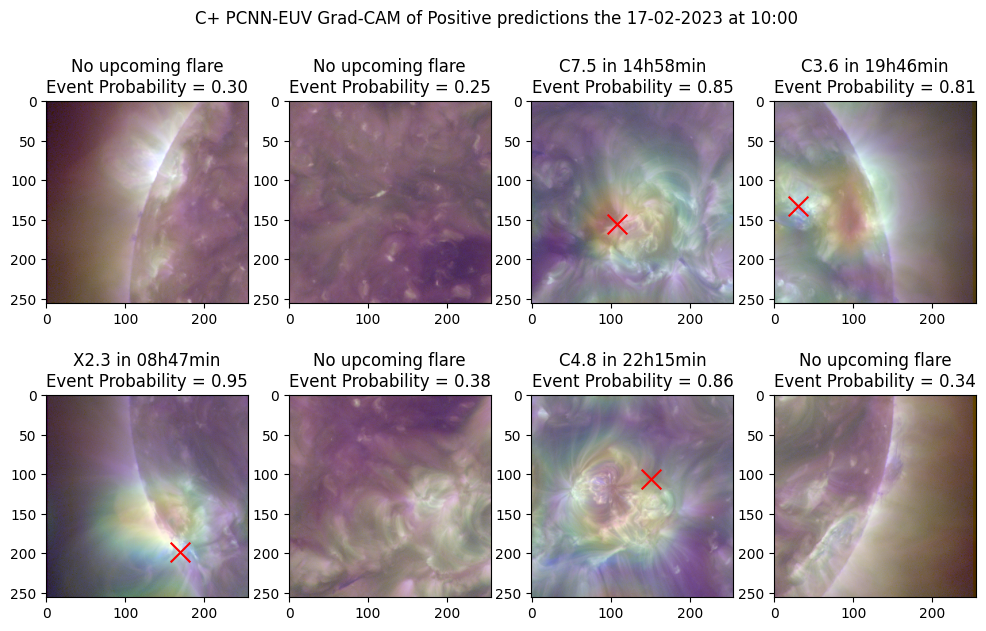

In [129]:
alphaMask = 0.125

rot_corr = True

targetSize = 256
sizeFactor = targetSize/112

fig = plt.figure(figsize=(12, 7))
for imgs in patchesHres:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            img = tf.reshape(imgs[r,c],shape=(targetSize,targetSize,3)).numpy().astype("uint8")
            plt.imshow(img)
            if preds[f'mpf_pt{ptcID}'].iloc[0] < 1e-6:
              title = 'No upcoming flare'
            else:
              # ***** explainability ******
              if targetSize == 112:
                plt.imshow(vizGcamEnsRes[ptcID], alpha=alphaMask, cmap=plt.get_cmap('jet'))
              else:
                from scipy.ndimage import zoom
                plt.imshow(zoom(vizGcamEnsRes[ptcID],zoom = targetSize/112,order=3), alpha=alphaMask, cmap=plt.get_cmap('jet'))
              # ***************************
              t2f = preds[f't2f_pt{ptcID}'].iloc[0]
              min = 60*(t2f-int(t2f))
              mpf = preds[f'mpf_pt{ptcID}'].iloc[0]
              cls = flux2cls(mpf, detailed = True)
              im_size = 4096
              dwsF =  im_size / (sizeFactor * 448)
              mod = targetSize
              x = preds[f'x_pt{ptcID}'].iloc[0]
              y = preds[f'y_pt{ptcID}'].iloc[0]

              # ROTATION CORRECATION
              if rot_corr:
                ylim = 614 / (0.6)
                Rpix = 959.63 / (0.6)
                ord = y - im_size //2
                if ord > 0:
                  ord = np.min((ord,ylim))
                else:
                  ord = np.max((ord,-ylim))
                y = ord
                ref = 2 * np.sqrt(Rpix**2 - ord**2) # ref = 2*Rpix
                half_carr = 27 * 24 / 2
                rot =  ref * t2f / half_carr
                x = x - rot


              x = x / dwsF % mod
              y = y / dwsF % mod


              print(rot, x)

              plt.scatter(x, y, marker="x", color="red", s=200)
              title = f'{cls} in {int(t2f):0>2d}h{min:0>2.0f}min'
            prob = preds[f'pred_pt{ptcID}'].iloc[0]
            title += f'\nEvent Probability = {prob:.2f}'
            ax.set_title(title)
            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')
fig.suptitle(f'C+ PCNN-EUV Grad-CAM of Positive predictions the {ts}')

## Guided-GCAM

143.02688431658365 107.77511108861904
185.63893892430073 29.552480476600522
75.27045759825364 169.2527645809578
211.87129521341635 150.4848728829886
CPU times: user 154 ms, sys: 10.4 ms, total: 165 ms
Wall time: 185 ms


Text(0.5, 0.98, 'C+ PCNN-EUV Guided-GCAM of Positive predictions the 17-02-2023 at 10:00')

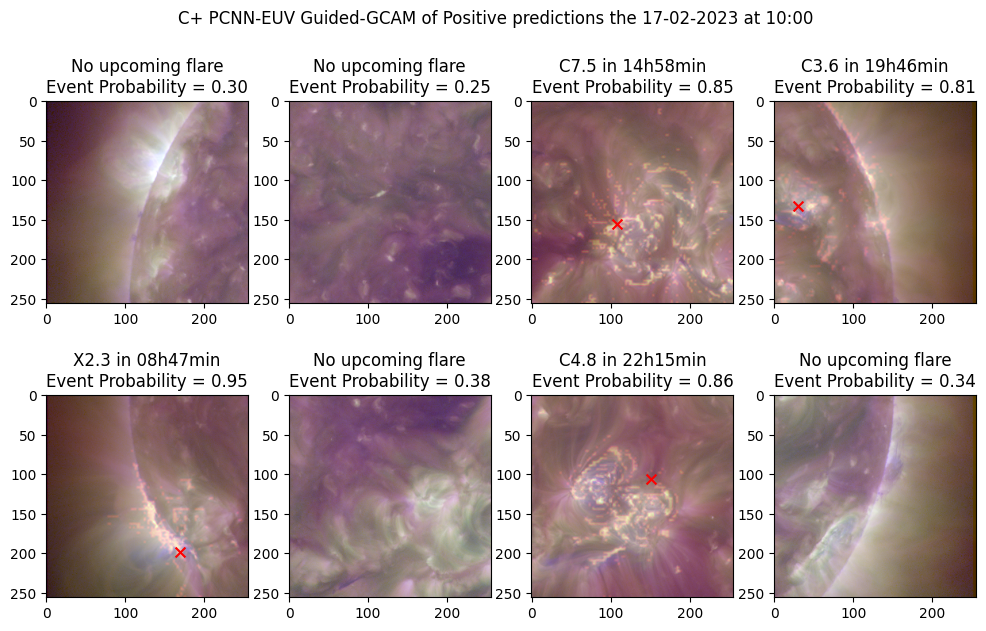

In [125]:
%%time
alphaMask = 0.2
sigmaFact = 1


rot_corr = True



targetSize = 256
sizeFactor = targetSize/112

fig = plt.figure(figsize=(12, 7))
for imgs in patchesHres:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            img = tf.reshape(imgs[r,c],shape=(targetSize,targetSize,3)).numpy().astype("uint8")
            plt.imshow(img)
            if preds[f'mpf_pt{ptcID}'].iloc[0] < 1e-6:
              title = 'No upcoming flare'
            else:
              # ***** explainability ******
              mask = vizGbGcamEnsRes[ptcID].copy()
              
              mean = mask.mean()
              sigma = mask.std()
              min =  mean - sigma * sigmaFact #0.3
              max =  mean + sigma * sigmaFact  #0.4
              mask[(mask<max)] = 0
              # vizGbGcamEns = np.mean(vizGbGcamEns, axis = -1)
              # vizGbGcamEns = ( vizGbGcamEns - vizGbGcamEns.min()) / (vizGbGcamEns.max() - vizGbGcamEns.min()) #255*
              if targetSize == 112:
                plt.imshow(mask, alpha=alphaMask, cmap=plt.get_cmap('hot'))
              else:
                from scipy.ndimage import zoom
                plt.imshow(zoom(mask,zoom = targetSize/112,order=3), alpha=alphaMask, cmap=plt.get_cmap('hot'))
                # from PIL import Image 
                # plt.imshow(Image.fromarray(mask).resize((targetSize,targetSize)), alpha=alphaMask, cmap=plt.get_cmap('hot'))
              # ***************************
              t2f = preds[f't2f_pt{ptcID}'].iloc[0]
              min = 60*(t2f-int(t2f))
              mpf = preds[f'mpf_pt{ptcID}'].iloc[0]
              cls = flux2cls(mpf, detailed = True)
              im_size = 4096
              dwsF = im_size / (sizeFactor*448)
              mod = targetSize
              x = preds[f'x_pt{ptcID}'].iloc[0]
              y = preds[f'y_pt{ptcID}'].iloc[0]

              # ROTATION CORRECATION
              if rot_corr:
                ylim = 614 / 0.6
                Rpix = 959.63 / 0.6
                ord = y - im_size //2
                if ord > 0:
                  ord = np.min((ord,ylim))
                else:
                  ord = np.max((ord,-ylim))
                y = ord
                ref = 2 * np.sqrt(Rpix**2 - ord**2) # ref = 2*Rpix
                half_carr = 27 * 24 / 2
                rot =  ref * t2f / half_carr
                x = x - rot


              x = x / dwsF % mod
              y = y / dwsF % mod


              print(rot, x)

              plt.scatter(x, y, marker="x", color="red", s=50)
              title = f'{cls} in {int(t2f):0>2d}h{min:0>2.0f}min'
            prob = preds[f'pred_pt{ptcID}'].iloc[0]
            title += f'\nEvent Probability = {prob:.2f}'
            ax.set_title(title)
            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')
fig.suptitle(f'C+ PCNN-EUV Guided-GCAM of Positive predictions the {ts}')

## Positions Estimations

143.02688431658365 107.77511108861904
185.63893892430073 29.552480476600522
75.27045759825364 169.2527645809578
211.87129521341635 150.4848728829886


/var/folders/2f/7x2b25l505v3y0t1yrc6rybm0000gn/T/ipykernel_77949/852706219.py:40: DeprecationWarning: Please use `center_of_mass` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  pos_est = ndimage.measurements.center_of_mass(explainability)


Text(0.5, 0.98, 'C+ PCNN-EUV Forecast and Position estimations against ground truth the 17-02-2023 at 10:00')

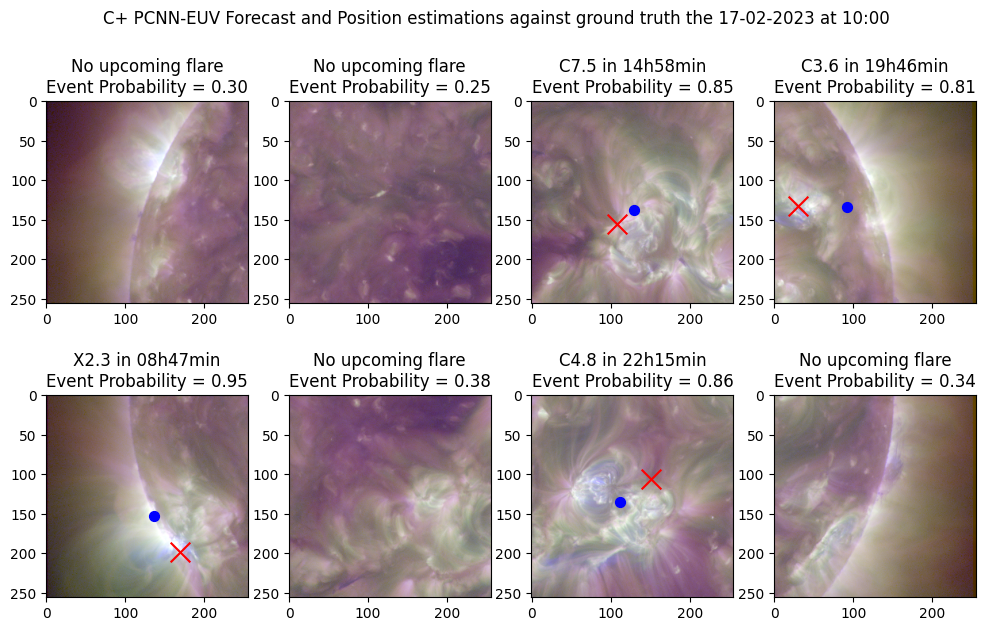

In [126]:
alphaMask = 0.2

explainType = 'gcam' # 'gcam', 'gbgcam
sigmaFact = 1

rot_corr = True

targetSize = 256
sizeFactor = targetSize/112


fig = plt.figure(figsize=(12, 7))
for imgs in patchesHres:
    ptcID = 0
    for r in range(2):
        for c in range(4):
            ax = plt.subplot(2, 4, ptcID+1)
            img = tf.reshape(imgs[r,c],shape=(targetSize,targetSize,3)).numpy().astype("uint8")
            plt.imshow(img)
            if preds[f'mpf_pt{ptcID}'].iloc[0] < 1e-6:
              title = 'No upcoming flare'
            else:
              # ***** explainability ******
              # plt.imshow(vizGcamEnsRes[ptcID], alpha=alphaMask, cmap=plt.get_cmap('jet'))
              if explainType == 'gcam':
                explainability = vizGcamEnsRes[ptcID].copy()
              else:
                mask = vizGbGcamEnsRes[ptcID].copy()
                mean = mask.mean()
                sigma = mask.std()
                min =  mean - sigma * sigmaFact #0.3
                max =  mean + sigma * sigmaFact  #0.4
                mask[(mask<max)] = 0
                explainability = mask
                
                
              if targetSize!=112:
                explainability = zoom(explainability,zoom = targetSize/112,order=3)

              pos_est = ndimage.measurements.center_of_mass(explainability)
              x_est, y_est = int(round(pos_est[0])), int(round(pos_est[1]))
              # ***************************
              t2f = preds[f't2f_pt{ptcID}'].iloc[0]
              min = 60*(t2f-int(t2f))
              mpf = preds[f'mpf_pt{ptcID}'].iloc[0]
              cls = flux2cls(mpf, detailed = True)
              im_size = 4096
              dwsF = im_size / (sizeFactor*448)
              mod = targetSize
              x = preds[f'x_pt{ptcID}'].iloc[0]
              y = preds[f'y_pt{ptcID}'].iloc[0]

              # ROTATION CORRECATION
              if rot_corr:
                ylim = 614 / 0.6
                Rpix = 959.63 / 0.6
                ord = y - im_size //2
                if ord > 0:
                  ord = np.min((ord,ylim))
                else:
                  ord = np.max((ord,-ylim))
                y = ord
                ref = 2 * np.sqrt(Rpix**2 - ord**2) # ref = 2*Rpix
                half_carr = 27 * 24 / 2
                rot =  ref * t2f / half_carr
                x = x - rot


              x = x / dwsF % mod
              y = y / dwsF % mod


              print(rot, x)

              plt.scatter(x, y, marker="x", color="red", s=200)
              plt.scatter(y_est, x_est, marker="o", color="blue", s=50)
              title = f'{cls} in {int(t2f):0>2d}h{min:0>2.0f}min'
            prob = preds[f'pred_pt{ptcID}'].iloc[0]
            title += f'\nEvent Probability = {prob:.2f}'
            ax.set_title(title)
            ptcID += 1
ts = date.strftime('%d-%m-%Y at %H:%M')
fig.suptitle(f'C+ PCNN-EUV Forecast and Position estimations against ground truth the {ts}')